# The Full Pipeline

**Inputs**: 
- scope 
- background image file path for 2159 scope
- experiment data
- config file
- timepoints (tp)
- number of UV bins

**Outputs**:
- droplets DataFrame (csv) 
- condensed DataFrame (csv)
- trimmed DataFrame (csv)
- heat maps

**Imports**:
- import python packages
- import kchip package depending on scope

Step 0: Average background images for 2159 scope

Step 1: Create droplets DataFrame
Compute and store:
- the RGB information of each droplet
- the cluster and cluster label of each droplet
- the location of each droplet
- the well ID of each droplet

Step 2: Create condensed DataFrame
- Loop through post-merge images and identify wells
- Map post-merge wells to pre-merge wells
- condense outputs to final dataframe

Step 3:
- filter droplets out based on barcode distances from cluster centroid
- filter dropelts out based on droplet area size
- check well locations
- check label counts

Step 4: 
- format output data for heatmap plotting
- get replicate counts for important combos
- get median, median tX-t0, and standard deviation values
- plot heatmaps


# Inputs (RUN FIRST)

In [1]:
# CHOOSE SCOPE
# 2159 = 0
# kyla = 1
scope = 0

## Background image inputs FOR 2159 SCOPE ONLY ##
if scope == 0:
    # path to background images
    input_folder = '../20200330_Troubleshoot_3_data' 
    # for generating bkgd images
    bkg_num_images = 10
    input_img_names = ['20200330_background'+str(n)+\
                       '.tif' for n in range(2,(bkg_num_images+1))]
    # path for background image output
    output_folder = input_folder
    output_img_name = 'background_image.tif'

## Data analysis inputs ##
# date of experiment
exp_date = "20200330_" 
# config file
config_file = exp_date+'config_COVID-19.yml' 
# generates new folder for saving outputs
newfolder = '../'+exp_date+'Troubleshoot_3_output/' 
# number of timepoints to analyze
tp = 3
# number of UV bins for barcodes
UV_bins = ['_UV0','_UV10'] 

In [2]:
# Make output data folder
import os
os.mkdir(newfolder)

# Imports and config

In [4]:
# basic imports 
import yaml
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import sys
sys.path.insert(1, '../../')
if scope == 0:
    # kchip imports
    import kchip_UV.io as kchip_io
    import kchip_UV.analyze as kchip_analyze
if scope == 1:
    # kchip imports
    import kchip_kyla.io as kchip_io
    import kchip_kyla.analyze as kchip_analyze
    
# Other
def rescale(arr):
    scaler = MinMaxScaler()
    scaler.fit(arr)
    return scaler.transform(arr)
%matplotlib inline

# Read in config file
with open(config_file, 'r') as ymlfile:
    config = yaml.load(ymlfile)
    
print yaml.dump(config)

barcodes:
  cluster:
    eps: 0.03
    min_samples: 2
    offset:
    - 0
    - 0
    - 0
    points_to_cluster: 2000
  path: ../20200330_Troubleshoot_3_data/20200330_Notes.xlsx
image:
  background_image: background_image
  base_path: ../20200330_Troubleshoot_3_data
  base_path_bkg: ../20200330_Troubleshoot_3_data
  bkg_img_suffix: _bg
  bugs: 3
  dyes:
  - 0
  - 1
  - 2
  - 4
  names:
    premerge: 20200330_premerge
    t0: 20200330_t0
    t1: 20200330_t1
    t2: 20200330_t2
  overlap: 0.05
  pixel_size: 6.5
  rescale:
  - 1.2
  - 1.0
  - 1.4
  - 1
  - 4
  size: 2048
  well_start_image:
  - 1
  - 2
  well_start_xy:
  - 540
  - 140
well_mask:
  filename: kchip/well_mask.tif
  pixel_size: 8.33625
  well_start_xy:
  - 850
  - 522



/root/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:28: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.


# Background Image (run for 2159 scope only)

In [5]:
# BACKGROUND IMAGE AVERAGING CELL

# Averages across multiple images (works for single images or stacks)
# Eg. to make background images
# Eg. to average foreground images
# Select settings
# Sigma is the sigma for the gaussian filter
# Use tuple for image stacks:
#     A 2048x2048 RYGBU imports as (2048, 2048, 5)
#     Use eg. sigma = (50,50,0) to filter in X and Y in each image, but not across channels
# For single images, use eg. sigma = (50,50) to filter in X and Y
sigma = (10,10,0)

# ---Begin code---

# Import packages
import numpy as np
from skimage import io
from os import path
import scipy.ndimage as ndimage
import tifffile

if scope == 0:
    # Create list to store image arrays in
    images = []

    # Import each image and apply gaussian filter
    # Add the smoothed image to the list
    for img in input_img_names:
        name = path.join(input_folder,img)
        img_ = io.imread(name)
        img_ = ndimage.gaussian_filter(img_, sigma=sigma, order=0)
        images.append(img_)
        print(img_.shape)

    # Stack images from list to ndarray
    img_stack = np.stack(images)
    print(img_stack.shape)

    # Average the image values across the images
    img_ave = img_stack.mean(axis=0)
    print(img_ave.shape)

    # Convert the ndarray data to a convenient output data type and shape
    img16 = img_ave.astype('uint16')
    if img16.shape[1] > img16.shape[2]:
        img16trans = np.transpose(img16, (2,0,1))
        print('img16trans shape is: '+str(img16trans.shape))
    else:
        img16trans = img16

    print(img16.shape)

    # Output the new image to the specified location
    new_name = path.join(output_folder,output_img_name)
    if len(img16.shape) == 3:
        tifffile.imsave(new_name, img16trans, photometric='minisblack')
    else:
        tifffile.imsave(new_name, img16)

(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)
(9, 5, 2048, 2048)
(5, 2048, 2048)
(5, 2048, 2048)


# Create Droplets df
- Initialize from images
- Identify droplets in the same well from fit to masks
- Cluster
- Map apriori labels to clusters

In [6]:
reload(kchip_analyze)
# Initialize droplets DataFrame from images
droplets, rotation_theta = kchip_analyze.initialize_droplets(config)
# print 'Rotation (degrees): ', rotation_theta*180/np.pi

droplets.to_csv(newfolder+exp_date+'droplets_found.csv')

## Identify droplets in the same well from fit to masks
# droplets = kchip_analyze.fit_droplets_to_mask(config,droplets,rotation_theta)
# droplets.to_csv('droplets_assigned.csv')

Creating droplets from: 5,4
Found 5119 Droplets
Creating droplets from: 3,5
Found 5428 Droplets
Creating droplets from: 1,1
Found 2599 Droplets
Creating droplets from: 9,5
Found 5763 Droplets
Creating droplets from: 4,6
Found 5730 Droplets
Creating droplets from: 1,6
Found 4459 Droplets
Creating droplets from: 8,5
Found 5398 Droplets
Creating droplets from: 6,5
Found 5552 Droplets
Creating droplets from: 2,6
Found 5475 Droplets
Creating droplets from: 4,5
Found 5701 Droplets
Creating droplets from: 3,4
Found 5360 Droplets
Creating droplets from: 7,5
Found 5320 Droplets
Creating droplets from: 7,7
Found 5720 Droplets
Creating droplets from: 3,6
Found 5717 Droplets
Creating droplets from: 8,6
Found 5579 Droplets
Creating droplets from: 3,7
Found 5793 Droplets
Creating droplets from: 9,2
Found 5518 Droplets
Creating droplets from: 8,3
Found 5626 Droplets
Creating droplets from: 8,2
Found 5653 Droplets
Creating droplets from: 1,7
Found 4181 Droplets
Creating droplets from: 6,4
Found 5641 D

In [6]:
droplets.head()

,IndexX,IndexY,ImageX,ImageY,Dye 0,Dye 1,Dye 2,Dye 3
0,1,1,1321,2027,9114.432,3550.12,3117.352,2648.96
1,1,1,1996,983,16458.960,3375.08,451.976,3647.20
2,1,1,1995,1051,10239.360,10433.04,2078.608,26494.24
3,1,1,1996,1031,2101.728,14724.20,5688.256,30755.36
4,1,1,647,1032,18849.648,6229.12,3773.056,39605.28


In [7]:
# From bchip libraries
# droplets = pd.read_csv("droplets_found_181219_chip1.csv",index_col=0)

from scipy.spatial.distance import pdist, squareform

def droplets_in_same_well(positions,close_threshold = 25):
    '''Identify droplets that are in the same well based on distance threshold
    Inputs:
    - Positions, (k x 2 ndarray), [x, y] positions of droplet centers
    - close_threshold, max distance between droplet centers to be considred in same well (default = 25)
    Outputs:
    - list of tuples (index 1, index 2) of indexes in positions of droplets in the same well
    '''

    pair_distances = squareform(pdist(positions))
    pair_distances[pair_distances==0]=float('inf')

    droplet1,droplet2 = np.where(pair_distances<close_threshold)
    zip_list = zip(droplet1,droplet2)

    # Sort list so small index is always first in tuple, and remove duplicates
    return list(set([tuple(sorted(tup_)) for tup_ in zip_list]))

def remove_overlap(config,df,show=0):
    ''' Remove droplets found in regions of image that overlap.
    Inputs:
        - config, config dictionary
        - df, pandas dataFrame
    Returns:
        - copy of dataframe, with dropped rows
    '''
    df = df.copy()
    maxX = df['IndexX'].max()
    maxY = df['IndexY'].max()
    
    overlap = config['image']['size']*(1-config['image']['overlap'])

    rmv_index = ((df['ImageX'] > overlap) & ~(df['IndexX']==maxX)) | ((df['ImageY'] > overlap) & ~(df['IndexY']==maxY))

    if show:
        print 'Removed: ' + str(np.sum(rmv_index)) + ' wells from dataFrame due to overlap in images.'

    return df.drop(df.index[rmv_index]).reset_index(drop=True)

In [8]:
# Remove overlap
droplets = remove_overlap(config,droplets,show=1)

unique_images = {tuple(row) for row in droplets[['IndexX','IndexY']].values}

droplets['Well_ID']=0
for x,y in unique_images:
    d = droplets.loc[(droplets['IndexX']==x) & (droplets['IndexY']==y)] 
    positions = d[['ImageX','ImageY']].values
    same_well = droplets_in_same_well(positions)
    
    well_id = np.zeros((d.shape[0],1))

    for i,dab in enumerate(same_well):
        d_a, d_b = dab
        well_id[d_a]=i
        well_id[d_b]=i

    droplets.loc[(droplets['IndexX']==x) & (droplets['IndexY']==y),'Well_ID']=well_id 
    
# Remove well_id = 0 
droplets = droplets[droplets['Well_ID']!=0]

# apply hash
droplets['Hash'] = droplets.apply(lambda row: hash((row['IndexX'],row['IndexY'],row['Well_ID'])),axis=1)

Removed: 24803 wells from dataFrame due to overlap in images.


In [9]:
droplets.head()

,IndexX,IndexY,ImageX,ImageY,Dye 0,Dye 1,Dye 2,Dye 3,Well_ID,Hash
1,1,1,1908,1028,10164.432,5027.20,5444.040,3289.76,940.0,2528504234772383333
2,1,1,1908,1006,10673.904,1268.28,8808.968,3294.24,940.0,2528504234772383333
4,1,1,708,982,12196.368,7440.12,659.512,3342.72,489.0,2528504235449276802
5,1,1,385,1073,17119.104,4844.92,5145.616,3098.72,605.0,2528504234643062894
12,1,1,592,903,20406.432,5559.60,4263.112,3240.96,645.0,2528504234428693878


In [9]:
# Saves droplets assigned to wells and prints droplet count
droplets.to_csv(newfolder+exp_date+'droplets_wells_assigned.csv')
print ('all droplets',droplets.shape)

# Removes wells with only one droplet and saves wells with combos
# prints combo droplet count and df head
droplets = droplets[droplets.groupby('Hash').Hash.transform(len) > 1]
droplets.to_csv(newfolder+exp_date+'droplets_wells_assigned_combos.csv')
print ('combos only',droplets.shape)
droplets.head()

('all droplets', (273979, 10))
('combos only', (259372, 10))


,IndexX,IndexY,ImageX,ImageY,Dye 0,Dye 1,Dye 2,Dye 3,Well_ID,Hash
0,5,4,205,494,1049.664,16037.04,5144.888,3208.96,372.0,7573303580995819404
1,5,4,1618,444,4133.568,1393.52,11679.584,23265.92,800.0,7573303580310770592
2,5,4,853,445,1423.008,9985.80,14053.984,3428.96,302.0,7573303580895625190
5,5,4,1765,446,8738.256,2823.64,392.728,3207.68,692.0,7573303580772129996
6,5,4,588,469,0.480,4301.92,14592.200,3240.80,164.0,7573303581349994300


In [10]:
# Corrects dye bleed through
droplets['Dye 1 corr']=droplets['Dye 1'].values-(0.02*droplets['Dye 2'].values)
droplets['Dye 2 corr']=droplets['Dye 2'].values-(0.14*droplets['Dye 1'].values)
droplets.to_csv(newfolder+exp_date+'droplets_dye_correction.csv')
droplets.head()

,IndexX,IndexY,ImageX,ImageY,Dye 0,Dye 1,Dye 2,Dye 3,Well_ID,Hash,Dye 1 corr,Dye 2 corr
0,5,4,205,494,1049.664,16037.04,5144.888,3208.96,372.0,7573303580995819404,15934.14224,2899.7024
1,5,4,1618,444,4133.568,1393.52,11679.584,23265.92,800.0,7573303580310770592,1159.92832,11484.4912
2,5,4,853,445,1423.008,9985.80,14053.984,3428.96,302.0,7573303580895625190,9704.72032,12655.9720
5,5,4,1765,446,8738.256,2823.64,392.728,3207.68,692.0,7573303580772129996,2815.78544,-2.5816
6,5,4,588,469,0.480,4301.92,14592.200,3240.80,164.0,7573303581349994300,4010.07600,13989.9312


# Separate UV bins

In [11]:
droplets = pd.read_csv(newfolder+exp_date+'droplets_dye_correction.csv'\
                       ,index_col=0)

In [12]:
# Normalize using background-subtracted and corrected values
# Note: in the current version of the kchip 5 color code, 
# background subtraction happens in the kchip.io.read step

colors=droplets[['Dye 0','Dye 1 corr','Dye 2 corr']].copy()
total=colors.sum(axis=1)
colors_UV=droplets[['Dye 0','Dye 1 corr','Dye 2 corr','Dye 3']].copy()
norm=colors_UV.div(total.values,axis=0)
norm.to_csv(newfolder+exp_date+'droplets_normdf.csv')

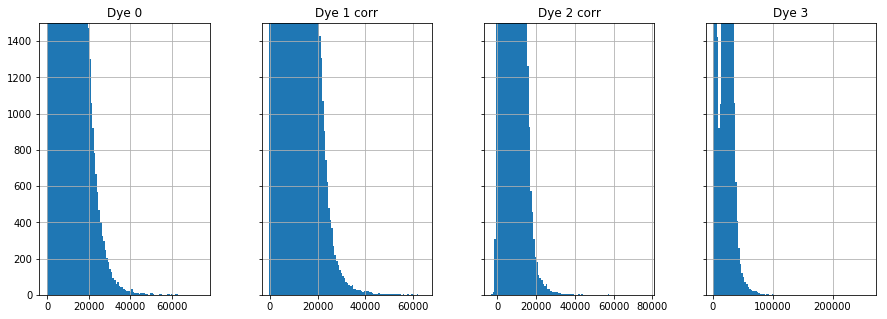

In [13]:
fig, axes = plt.subplots(1,4,figsize=(15,5), sharey=True)
axes[0].set_ylim(0,1500)

droplets.hist('Dye 0', ax=axes[0], bins=100) #, range=(0,16000))
droplets.hist('Dye 1 corr', ax=axes[1], bins=100) #, range=(0,16000))
droplets.hist('Dye 2 corr', ax=axes[2], bins=100) #, range=(0,8200))
droplets.hist('Dye 3', ax=axes[3], bins=100) #,range=(0,1000))
plt.savefig(newfolder+exp_date+'droplets_corr_raw.png',bbox_inches='tight')

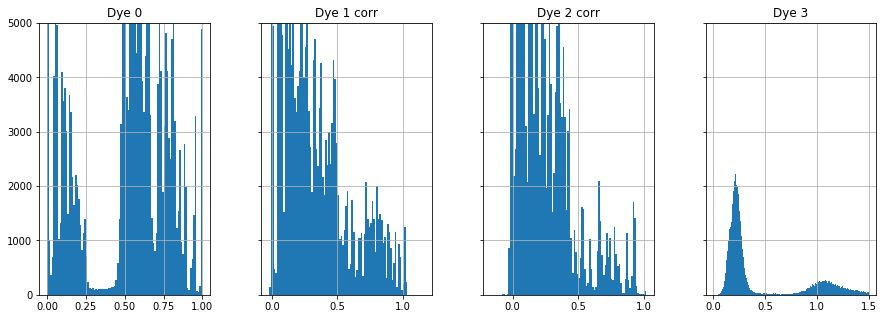

In [14]:
fig, axes = plt.subplots(1,4,figsize=(15,5), sharey=True)
axes[0].set_ylim(0,5000)

norm.hist('Dye 0', ax=axes[0], bins=100) #, range=(0,1))
norm.hist('Dye 1 corr', ax=axes[1], bins=100) #, range=(0,1))
norm.hist('Dye 2 corr', ax=axes[2], bins=100) #, range=(0,1))
norm.hist('Dye 3', ax=axes[3], bins=1000, range=(0,1.5))
plt.savefig(newfolder+exp_date+'droplets_corr_normalized.png',bbox_inches='tight')

In [15]:
# reset column names for clustering code
droplets[['R','G','B','Dye3_norm']]=\
    norm[['Dye 0', 'Dye 1 corr', 'Dye 2 corr','Dye 3']]                

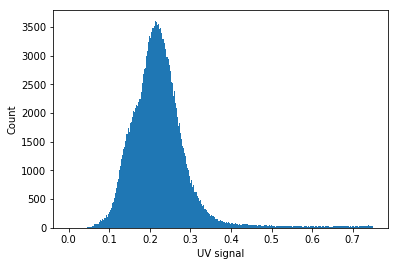

In [16]:
# Plotting UV signal for binning
plt.hist(droplets['Dye3_norm'], bins=300,range=(0,0.75))
plt.ylabel('Count')
plt.xlabel('UV signal')
plt.savefig(newfolder+exp_date+'UV_histogram.png',dpi=300)

In [17]:
# Binning droplets based on normalized UV signal
UV0 = droplets.loc[droplets['Dye3_norm'] < 0.35]
UV10 = droplets.loc[(droplets['Dye3_norm'] > 0.6)&(droplets['Dye3_norm'] < 2.00)]

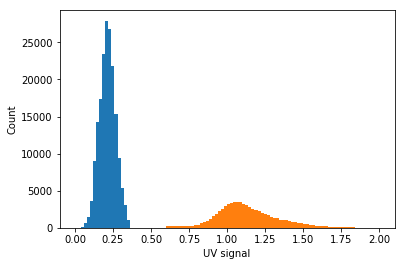

In [18]:
# Plotting UV-binned droplets
plt.hist(UV0['Dye3_norm'], bins=100, range=(0,2))
plt.hist(UV10['Dye3_norm'], bins=100, range=(0,2))
# plt.ylim(0,2000)
# plt.xlim(0.0,0.045)
plt.ylabel('Count')
plt.xlabel('UV signal')
plt.savefig(newfolder+exp_date+'UV_histogram_binned.png',dpi=300)

In [20]:
# Saving UV-binned droplets
droplets.to_csv(newfolder+exp_date+'droplets_normalized.csv')
UV0.to_csv(newfolder+exp_date+'droplets_found_UV0.csv')
UV10.to_csv(newfolder+exp_date+'droplets_found_UV10.csv')
print ('UV0',UV0.shape)
print ('UV10',UV10.shape)

('UV0', (180593, 16))
('UV10', (71354, 16))


In [21]:
droplets_check = droplets[['R','G','B']].values
print(droplets_check)

[[0.05279068 0.80137477 0.14583454]
 [0.24636852 0.06913394 0.68449754]
 [0.05983123 0.40804081 0.53212796]
 ...
 [0.58339523 0.32319249 0.09341228]
 [0.58236141 0.00456746 0.41307113]
 [0.0814039  0.17309332 0.74550278]]


In [50]:
droplets.head()

,IndexX,IndexY,ImageX,ImageY,Dye 0,Dye 1,Dye 2,Dye 3,Well_ID,Hash,Dye 1 corr,Dye 2 corr,R,G,B,Dye3_norm
0,1,3,1269,642,34789.104,23015.12,6487.936,10152.64,1813.0,2528501711876249568,22885.36128,3265.8192,0.570872,0.375537,0.053590,0.166600
1,1,3,745,651,25005.312,11485.04,12487.608,10236.96,1206.0,2528501711765569913,11235.28784,10879.7024,0.530670,0.238438,0.230892,0.217252
4,1,3,1861,662,37581.360,1196.12,199.304,10268.32,684.0,2528501713562075471,1192.13392,31.8472,0.968458,0.030721,0.000821,0.264611
5,1,3,774,672,42071.520,1296.60,99.288,10490.08,1261.0,2528501711699162120,1294.61424,-82.2360,0.971990,0.029910,-0.001900,0.242355
7,1,3,714,674,36371.808,12014.32,4198.544,9627.52,1000.0,2528501713184599595,11930.34912,2516.5392,0.715717,0.234763,0.049520,0.189448


# Go to Interactive Clustering

In [22]:
UV0 = pd.read_csv(newfolder+exp_date+'droplets_clustered_corrected_UV0.csv', index_col=0)
UV10 = pd.read_csv(newfolder+exp_date+'droplets_clustered_corrected_UV10.csv', index_col=0)
droplets = UV0.append(UV10)

In [23]:
print('# Labels/droplet groups',len(droplets.Label.unique()))

('# Labels/droplet groups', 150)


In [24]:
droplets.to_csv(newfolder+exp_date+'droplets_clustered_corrected_all.csv')

# Creates Condensed df
- Create pre-merge wells dataFrame
- Loop through post-merge images and identify wells
- Map post-merge wells to pre-merge wells

In [25]:
# If reading in csv file:
droplets = pd.read_csv(newfolder+exp_date+'droplets_clustered_corrected_all.csv',index_col=0)

# Identify premerge wells
pre_wells = droplets.groupby(['IndexX','IndexY','Well_ID'],as_index=False)[['ImageX','ImageY']].mean()
print(pre_wells)

# List of timepoints
timepoints = ['t'+str(i) for i in range(tp)]
print(timepoints)

# Analyze data for each timepoint
pre_post_all = []
for timepoint in timepoints:
    print 'Now analyzing timepoint: ', timepoint
    # Identify postmerge wells and map to pre-merge wells
    pre_post_all.append(kchip_analyze.map_pre_to_post(config,timepoint,pre_wells))
   
# Condense output
condensed = kchip_analyze.stack_timepoints(droplets,pre_post_all,timepoints)
# Pre_post output
pre_post = pd.DataFrame(pre_post_all[0]) 

        IndexX  IndexY  Well_ID  ImageX  ImageY
0            1       1      1.0  1646.0  1428.0
1            1       1      4.0  1178.5  1624.0
2            1       1      9.0  1233.5  1767.5
3            1       1     10.0  1352.0  1681.0
4            1       1     13.0  1148.0  1561.0
5            1       1     15.0   975.0   447.0
6            1       1     16.0  1584.5  1429.5
7            1       1     18.0  1703.5  1282.5
8            1       1     19.0  1115.5  1380.0
9            1       1     20.0   796.0  1612.0
10           1       1     21.0  1587.0  1477.5
11           1       1     24.0  1761.5  1577.5
12           1       1     25.0  1120.0   531.5
13           1       1     29.0  1908.5  1838.5
14           1       1     30.0  1030.5   629.5
15           1       1     32.0  1645.5  1281.0
16           1       1     34.0  1264.5  1163.5
17           1       1     35.0  1734.0   192.0
18           1       1     37.0  1731.5  1406.5
19           1       1     39.0   534.0 

../../kchip_UV/analyze.py:377: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  post = post.loc[well_assignments[:,1]].reset_index()


Now analyzing timepoint:  t1
Now analyzing: 3,5
Now analyzing: 6,4
Now analyzing: 4,2
Now analyzing: 4,5
Now analyzing: 7,5
Now analyzing: 8,3
Now analyzing: 5,3
Now analyzing: 4,4
Now analyzing: 5,4
Now analyzing: 8,4
Now analyzing: 9,7
Now analyzing: 9,6
Now analyzing: 5,7
Now analyzing: 2,5
Now analyzing: 2,7
Now analyzing: 7,6
Now analyzing: 8,2
Now analyzing: 4,1
Now analyzing: 1,4
Now analyzing: 2,1
Now analyzing: 4,3
Now analyzing: 3,3
Now analyzing: 7,3
Now analyzing: 9,4
Now analyzing: 1,5
Now analyzing: 6,2
Now analyzing: 9,5
Now analyzing: 8,1
Now analyzing: 1,3
Now analyzing: 7,4
Now analyzing: 9,3
Now analyzing: 5,6
Now analyzing: 2,2
Now analyzing: 8,7
Now analyzing: 2,4
Now analyzing: 1,7
Now analyzing: 8,5
Now analyzing: 5,1
Now analyzing: 3,4
Now analyzing: 5,2
Now analyzing: 1,6
Now analyzing: 4,6
Now analyzing: 6,1
Now analyzing: 3,7
Now analyzing: 9,2
Now analyzing: 4,7
Now analyzing: 6,3
Now analyzing: 6,6
Now analyzing: 7,2
Now analyzing: 5,5
Now analyzing: 6,5
No

In [26]:
# Save outputs
pre_post.to_csv(newfolder+exp_date+'pre_post.csv')
condensed.to_csv(newfolder+exp_date+'condensed_output.csv')

# Images Analyzed, Load in Data

In [132]:
# Read in droplets and condensed
droplets = pd.read_csv(newfolder+exp_date+'droplets_clustered_corrected_all.csv',\
                       index_col=0)
pre_post = pd.read_csv(newfolder+exp_date+'pre_post.csv',index_col=0)
condensed = pd.read_csv(newfolder+exp_date+'condensed_output.csv', index_col=0)

# Quality Control (filtering)

In [27]:
# Gets all guides and targets from notes file
all_labels = []
for i in UV_bins:
    Notes_path = '../20200330_Troubleshoot_3_data/20200330_Notes'+i+'.xlsx'
    labels = pd.read_excel(Notes_path,'Labels',index_col=0).fillna(u'BLANK')
    labels_list = []
    for i in range(len(labels.index)):
        for j in range(len(labels.columns)):
            x = labels.iloc[i,j]
            if x != u'BLANK':
                labels_list.append(x)
    stringlist = [i.encode("utf-8") for i in labels_list]
    all_labels.append(stringlist)
all_labels = [item for items in all_labels for item in items]
guides = [x for x in all_labels if x.startswith('c')] 
targets = [x for x in all_labels if x.startswith('T')] 
targets = sorted(targets, key = lambda x: int(x.split('T')[1]))
guides = sorted(guides, key = lambda x: int(x.split('A')[1]))

In [28]:
# Pull out guides and targets from the droplets dataframe:
guides_only = droplets[droplets['Label'].isin(guides)]
targets_only = droplets[droplets['Label'].isin(targets)]

# Merge condensed with the guides and then targets:
with_guides = condensed.merge(guides_only,on=['Hash'],how='outer')
with_both = with_guides.merge(targets_only,on=['Hash'],how='outer',suffixes=('_left','_right'))

# Remove any rows with NaN:
trimmed = with_both.dropna()

In [57]:
trimmed.head()

,Hash,T1,T10,T100,T101,T102,T103,T104,T105,T106,...,Dye 2 corr_right,R_right,G_right,B_right,Dye3_norm_right,PlaneX_right,PlaneY_right,Cluster_right,Label_right,Barcode_right
0,2528504235178985434,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-200.8776,0.542554,0.466890,-0.009444,1.266731,-0.075664,-1.018888,74.0,T61,"[0.0, 21.053, 28.947]"
1,2528504235173160189,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7786.2568,0.218208,0.404540,0.377252,0.153128,0.186332,-0.245497,48.0,T115,"[21.053, 18.421, 10.526]"
2,2528504235188305826,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,7872.1496,0.065740,0.499815,0.434445,0.173633,0.434074,-0.131110,5.0,T104,"[26.316, 21.053, 2.6316]"
15,2528504235168499993,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11499.2752,0.068128,0.143934,0.787938,0.212688,0.075806,0.575876,45.0,T97,"[42.105, 5.2632, 2.6316]"
16,2528504235169665042,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,6711.6392,0.102202,0.637968,0.259831,0.134964,0.535766,-0.480339,12.0,T106,"[18.421, 26.316, 5.2632]"


In [29]:
# Calculates centroids and barcode distances
trimmed['CentroidX_left'] = trimmed.groupby('Label_left')['PlaneX_left'].transform('median')
trimmed['CentroidY_left'] = trimmed.groupby('Label_left')['PlaneY_left'].transform('median')
trimmed['distance_left'] = np.sqrt((trimmed.PlaneX_left-trimmed.CentroidX_left)**2\
                                   +(trimmed.PlaneY_left-trimmed.CentroidY_left)**2)

trimmed['CentroidX_right'] = trimmed.groupby('Label_right')['PlaneX_right'].transform('median')
trimmed['CentroidY_right'] = trimmed.groupby('Label_right')['PlaneY_right'].transform('median')
trimmed['distance_right'] = np.sqrt((trimmed.PlaneX_right-trimmed.CentroidX_right)**2\
                                    +(trimmed.PlaneY_right-trimmed.CentroidY_right)**2)

/root/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/root/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/root/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

In [30]:
# renames columns
trimmed = trimmed.rename(columns = {'Dye 0_left':'Dye0_left', \
                                    'Dye 1_left':'Dye1_left', \
                                    'Dye 2_left':'Dye2_left', \
                                    'Dye 0_right':'Dye0_right',\
                                    'Dye 1_right':'Dye1_right',\
                                    'Dye 2_right':'Dye2_right'})

In [31]:
# normalized reporter signal
trimmed['summed']=(trimmed.Dye0_left+trimmed.Dye1_left+trimmed.Dye2_left+\
                   trimmed.Dye0_right+trimmed.Dye1_right+trimmed.Dye2_right)
med = trimmed.summed.median()
trimmed['ratio']=trimmed.summed/med
trimmed['t0_norm2']=trimmed.t0/trimmed.ratio
trimmed['t1_norm2']=trimmed.t1/trimmed.ratio
trimmed['t2_norm2']=trimmed.t2/trimmed.ratio

## Distance and Area Filtering

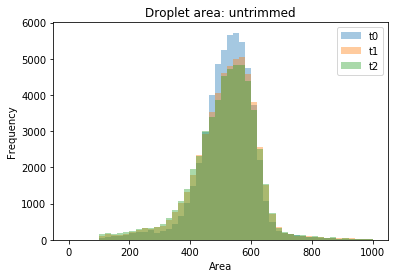

In [32]:
plt.hist(trimmed['t0_Area'],bins=50,range=(0,1000), label = 't0', alpha=0.4)
plt.hist(trimmed['t1_Area'],bins=50,range=(0,1000), label = 't1', alpha=0.4)
plt.hist(trimmed['t2_Area'],bins=50,range=(0,1000), label = 't2', alpha=0.4)
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.title('Droplet area: untrimmed')
# plt.xlim(450,650)
plt.legend()
plt.show()

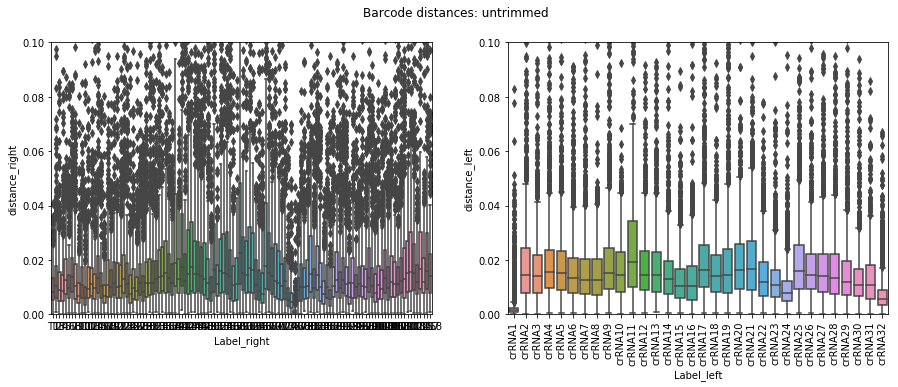

In [33]:
# To test barcode distances:
Ldist = trimmed[['Label_left','distance_left']]
Lcolumn_order = guides
Rdist = trimmed[['Label_right','distance_right']]
Rcolumn_order = targets

f, axes = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot(x='Label_left',y='distance_left',data=Ldist,order=Lcolumn_order, ax=axes[1])
sns.boxplot(x='Label_right',y='distance_right',data=Rdist,order=Rcolumn_order, ax=axes[0])
plt.xticks(rotation=90)
ylim = [0.0,0.10]
plt.setp(axes, ylim=ylim)
f.suptitle('Barcode distances: untrimmed')
plt.show()

In [34]:
Ldistance_trimmed = trimmed[trimmed['distance_left']<0.05]
distance_trimmed = Ldistance_trimmed[Ldistance_trimmed['distance_right']<0.05]
print("barcode untrimmed",trimmed.shape)
print("barcode trimmed",distance_trimmed.shape)

('barcode untrimmed', (55815, 209))
('barcode trimmed', (51122, 209))


/root/anaconda2/lib/python2.7/site-packages/seaborn/axisgrid.py:230: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


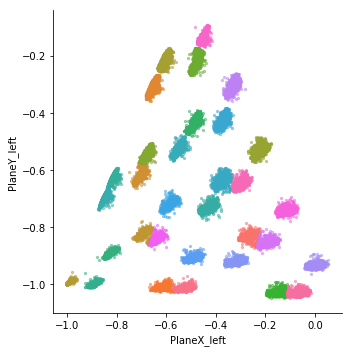

In [35]:
g = sns.FacetGrid(distance_trimmed, hue="Label_left", size=5)
g.map(plt.scatter, "PlaneX_left", "PlaneY_left", s=5, alpha=.5)
# g.add_legend();

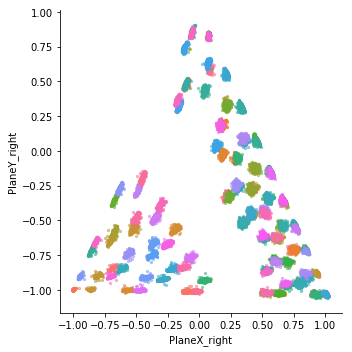

In [36]:
f = sns.FacetGrid(distance_trimmed, hue="Label_right", size=5)
f.map(plt.scatter, "PlaneX_right", "PlaneY_right", s=5, alpha=.5)
# f.add_legend();

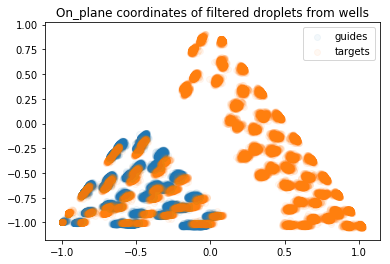

In [37]:
# Plots droplets onto the triangle, filtered
plt.scatter(distance_trimmed['PlaneX_left'],distance_trimmed['PlaneY_left'],alpha=0.05, label = 'guides')
plt.scatter(distance_trimmed['PlaneX_right'],distance_trimmed['PlaneY_right'],alpha=0.05, label = 'targets')
plt.gca().set_title('On_plane coordinates of filtered droplets from wells')
plt.legend()

In [38]:
d_area_trimmed = distance_trimmed[distance_trimmed['t0_Area']<700]
d_area_trimmed = d_area_trimmed[d_area_trimmed['t0_Area']>350]
print("aread trimmed",d_area_trimmed.shape)

('aread trimmed', (48695, 209))


In [39]:
d_area_trimmed.to_csv(newfolder+exp_date+'distance_and_area_filtered.csv')

## Well Locations

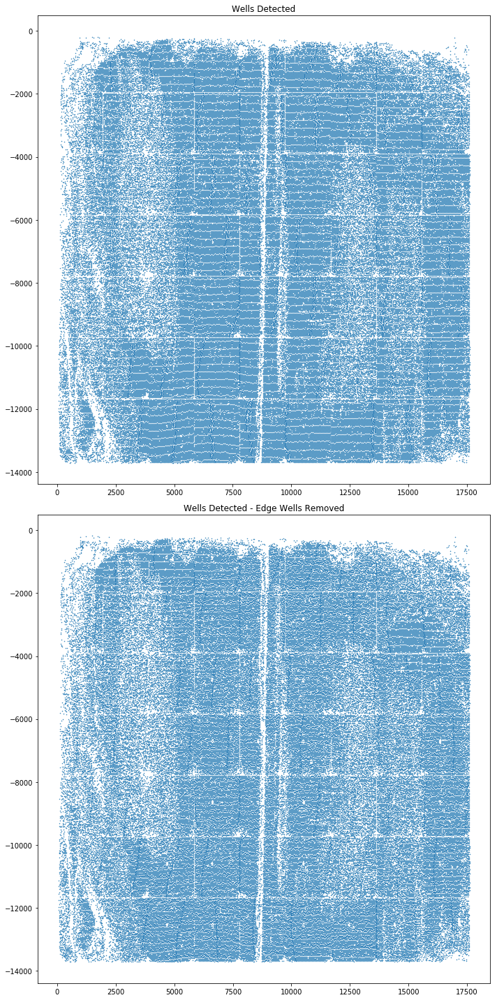

In [40]:
# Plot locations of all identified droplets on 2D plane to represent the chip
# Can identify portion of chip where droplet identification failed
# Regions may due to cross merging
fig, axes = plt.subplots(2,1,figsize=(10,20))

axes[0].plot(pre_post['Pre_GlobalX'],-pre_post['Pre_GlobalY'],'.',ms=1)
axes[0].set_title('Wells Detected')
# axes[0].set_axis_off()

axes[1].plot(pre_post['Post_GlobalX'],-pre_post['Post_GlobalY'],'.',ms=1)
axes[1].set_title('Wells Detected - Edge Wells Removed')
# axes[1].set_axis_off()

plt.tight_layout()

## Label Counts

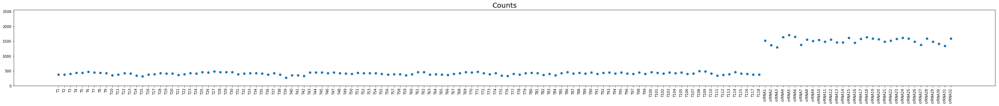

In [41]:
labels = targets+guides
counts = d_area_trimmed.sum()[labels]
# print(counts)

fig, axes = plt.subplots(1,1,figsize=(50,4))
axes.plot(counts.values,'o')
axes.set_xticks(range(len(counts.index.values)))
axes.set_xticklabels(counts.index.values,size=10,rotation=90)
plt.ylim(0, 1.5*max(counts))
axes.set_title('Counts',size=20)
plt.savefig(newfolder+exp_date+'Label_counts.png',bbox_inches='tight',dpi=300)

# Data Analysis

In [44]:
condensed = pd.read_csv(newfolder+exp_date+'distance_and_area_filtered.csv',index_col=0)
targets = list(set(condensed['Label_right']))
targets = sorted(targets, key = lambda x: int(x.split('T')[1]))
guides = list(set(condensed['Label_left']))
guides = sorted(guides, key = lambda x: int(x.split('A')[1]))
figures_folder = '../'+exp_date+'Troubleshoot_3_figures/'

In [45]:
# make output folder
import os
os.mkdir(figures_folder)

In [46]:
# reads in plate map to map sabeti sample names to blainey sample names
map_path = '../'+exp_date+'Troubleshoot_3_data/'+exp_date+'PlateMap.xlsx'
sabeti_labels = pd.read_excel(map_path)
xl = pd.ExcelFile(map_path)
nrows = xl.book.sheet_by_index(0).nrows
platetables = (nrows+1)/10

s_names = []
b_names = []
for i in range(platetables):
    df_s = xl.parse(0,index_col=0,skiprows=10*i,\
                     skipfooter=nrows-9-i*10).dropna(axis=1, how='all')
    s_names.append(df_s.values.tolist())
    df_b = xl.parse(1,index_col=0,skiprows=10*i,\
                     skipfooter= nrows-9-i*10).dropna(axis=1, how='all')
    b_names.append(df_b.values.tolist())
# flattens lists
s_names = [item for items in s_names for item in items]
s_names = [item for items in s_names for item in items]
b_names = [item for items in b_names for item in items]
b_names = [item for items in b_names for item in items]
# makes elements into strings
s_string = [str(i) for i in s_names]
b_string = [str(i) for i in b_names]
# drop nan values
clean_s = [x for x in s_string if str(x) != 'nan']
clean_b = [x for x in b_string if str(x) != 'nan']
# creates mapping dictionary
mapping = {clean_b[i]: clean_s[i] for i in range(len(clean_b))}

In [47]:
# for count of replicate numbers
num_fl = pd.DataFrame(0, index=guides, columns=targets)
# for medians and standard deviations of tX signal
median_t0 = pd.DataFrame(0, index=guides, columns=targets)
stdev_t0 = pd.DataFrame(0, index=guides, columns=targets)
median_t1 = pd.DataFrame(0, index=guides, columns=targets)
stdev_t1 = pd.DataFrame(0, index=guides, columns=targets)
median_t2 = pd.DataFrame(0, index=guides, columns=targets)
stdev_t2 = pd.DataFrame(0, index=guides, columns=targets)
# for medians and standard deviations of tX - t0
median_diff_t1 = pd.DataFrame(0, index=guides, columns=targets)
stdev_diff_t1 = pd.DataFrame(0, index=guides, columns=targets)
median_diff_t2 = pd.DataFrame(0, index=guides, columns=targets)
stdev_diff_t2 = pd.DataFrame(0, index=guides, columns=targets)

In [48]:
# Loop through detection mixes and targets
for guide in guides:
    for target in targets:
        groups = condensed.groupby([guide, target])[['t0_norm2','t1_norm2','t2_norm2']].groups
        if (1,1) in groups:
#         Get t0 and t1 values from the group of wells that have 1 droplet each of the current detection mix and target:
#         print curr_dm, curr_tgt
            print(guide, target, 'found')
            curr_pair = condensed.groupby([guide, target])[['t0_norm2',\
                                                            't1_norm2','t2_norm2']].get_group((1,1))
# Subtract each t0 value from each t1 value, removing "NaN" values
# "NaN" values arise when there is a missing t1 value = the droplet wasn't 
# found in the t1 images
            curr_pair_sub_t1 = (curr_pair['t1_norm2']-curr_pair['t0_norm2']).dropna()
            curr_pair_sub_t2 = (curr_pair['t2_norm2']-curr_pair['t0_norm2']).dropna()

            median_t0.loc[guide, target] = curr_pair['t0_norm2'].median()
            stdev_t0.loc[guide, target] = curr_pair['t0_norm2'].std()
            median_t1.loc[guide, target] = curr_pair['t1_norm2'].median()
            stdev_t1.loc[guide, target] = curr_pair['t1_norm2'].std()
            median_t2.loc[guide, target] = curr_pair['t2_norm2'].median()
            stdev_t2.loc[guide, target] = curr_pair['t2_norm2'].std()

            median_diff_t1.loc[guide, target] = curr_pair_sub_t1.median()
            stdev_diff_t1.loc[guide, target] = curr_pair_sub_t1.std()
            median_diff_t2.loc[guide, target] = curr_pair_sub_t2.median()
            stdev_diff_t2.loc[guide, target] = curr_pair_sub_t2.std()
# Count the number of wells in the group, and store the 
# value in the num_fl dataframe
            num_fl.loc[guide, target] = curr_pair_sub_t1.count()
        else:
            print(guide, target, 'not found')
            num_fl.loc[guide, target] = 0

('crRNA1', 'T1', 'found')
('crRNA1', 'T2', 'found')
('crRNA1', 'T3', 'found')
('crRNA1', 'T4', 'found')
('crRNA1', 'T5', 'found')
('crRNA1', 'T6', 'found')
('crRNA1', 'T7', 'found')
('crRNA1', 'T8', 'found')
('crRNA1', 'T9', 'found')
('crRNA1', 'T10', 'found')
('crRNA1', 'T11', 'found')
('crRNA1', 'T12', 'found')
('crRNA1', 'T13', 'found')
('crRNA1', 'T14', 'found')
('crRNA1', 'T15', 'found')
('crRNA1', 'T16', 'found')
('crRNA1', 'T17', 'found')
('crRNA1', 'T18', 'found')
('crRNA1', 'T19', 'found')
('crRNA1', 'T20', 'found')
('crRNA1', 'T21', 'found')
('crRNA1', 'T22', 'found')
('crRNA1', 'T23', 'found')
('crRNA1', 'T24', 'found')
('crRNA1', 'T25', 'found')
('crRNA1', 'T26', 'found')
('crRNA1', 'T27', 'found')
('crRNA1', 'T28', 'found')
('crRNA1', 'T29', 'found')
('crRNA1', 'T30', 'found')
('crRNA1', 'T31', 'found')
('crRNA1', 'T32', 'found')
('crRNA1', 'T33', 'found')
('crRNA1', 'T34', 'found')
('crRNA1', 'T35', 'found')
('crRNA1', 'T36', 'found')
('crRNA1', 'T37', 'found')
('crRNA1',

('crRNA3', 'T71', 'found')
('crRNA3', 'T72', 'found')
('crRNA3', 'T73', 'found')
('crRNA3', 'T74', 'found')
('crRNA3', 'T75', 'found')
('crRNA3', 'T76', 'found')
('crRNA3', 'T77', 'found')
('crRNA3', 'T78', 'found')
('crRNA3', 'T79', 'found')
('crRNA3', 'T80', 'found')
('crRNA3', 'T81', 'found')
('crRNA3', 'T82', 'found')
('crRNA3', 'T83', 'found')
('crRNA3', 'T84', 'found')
('crRNA3', 'T85', 'found')
('crRNA3', 'T86', 'found')
('crRNA3', 'T87', 'found')
('crRNA3', 'T88', 'found')
('crRNA3', 'T89', 'found')
('crRNA3', 'T90', 'found')
('crRNA3', 'T91', 'found')
('crRNA3', 'T92', 'found')
('crRNA3', 'T93', 'found')
('crRNA3', 'T94', 'found')
('crRNA3', 'T95', 'found')
('crRNA3', 'T96', 'found')
('crRNA3', 'T97', 'found')
('crRNA3', 'T98', 'found')
('crRNA3', 'T99', 'found')
('crRNA3', 'T100', 'found')
('crRNA3', 'T101', 'found')
('crRNA3', 'T102', 'found')
('crRNA3', 'T103', 'found')
('crRNA3', 'T104', 'found')
('crRNA3', 'T105', 'found')
('crRNA3', 'T106', 'found')
('crRNA3', 'T107', 'f

('crRNA6', 'T20', 'found')
('crRNA6', 'T21', 'found')
('crRNA6', 'T22', 'found')
('crRNA6', 'T23', 'found')
('crRNA6', 'T24', 'found')
('crRNA6', 'T25', 'found')
('crRNA6', 'T26', 'found')
('crRNA6', 'T27', 'found')
('crRNA6', 'T28', 'found')
('crRNA6', 'T29', 'found')
('crRNA6', 'T30', 'found')
('crRNA6', 'T31', 'found')
('crRNA6', 'T32', 'found')
('crRNA6', 'T33', 'found')
('crRNA6', 'T34', 'found')
('crRNA6', 'T35', 'found')
('crRNA6', 'T36', 'found')
('crRNA6', 'T37', 'found')
('crRNA6', 'T38', 'found')
('crRNA6', 'T39', 'found')
('crRNA6', 'T40', 'found')
('crRNA6', 'T41', 'found')
('crRNA6', 'T42', 'found')
('crRNA6', 'T43', 'found')
('crRNA6', 'T44', 'found')
('crRNA6', 'T45', 'found')
('crRNA6', 'T46', 'found')
('crRNA6', 'T47', 'found')
('crRNA6', 'T48', 'found')
('crRNA6', 'T49', 'found')
('crRNA6', 'T50', 'found')
('crRNA6', 'T51', 'found')
('crRNA6', 'T52', 'found')
('crRNA6', 'T53', 'found')
('crRNA6', 'T54', 'found')
('crRNA6', 'T55', 'found')
('crRNA6', 'T56', 'found')
(

('crRNA8', 'T87', 'found')
('crRNA8', 'T88', 'found')
('crRNA8', 'T89', 'found')
('crRNA8', 'T90', 'found')
('crRNA8', 'T91', 'found')
('crRNA8', 'T92', 'found')
('crRNA8', 'T93', 'found')
('crRNA8', 'T94', 'found')
('crRNA8', 'T95', 'found')
('crRNA8', 'T96', 'found')
('crRNA8', 'T97', 'found')
('crRNA8', 'T98', 'found')
('crRNA8', 'T99', 'found')
('crRNA8', 'T100', 'found')
('crRNA8', 'T101', 'found')
('crRNA8', 'T102', 'found')
('crRNA8', 'T103', 'found')
('crRNA8', 'T104', 'found')
('crRNA8', 'T105', 'found')
('crRNA8', 'T106', 'found')
('crRNA8', 'T107', 'found')
('crRNA8', 'T108', 'found')
('crRNA8', 'T109', 'found')
('crRNA8', 'T110', 'found')
('crRNA8', 'T111', 'found')
('crRNA8', 'T112', 'found')
('crRNA8', 'T113', 'found')
('crRNA8', 'T114', 'found')
('crRNA8', 'T115', 'found')
('crRNA8', 'T116', 'found')
('crRNA8', 'T117', 'found')
('crRNA8', 'T118', 'found')
('crRNA9', 'T1', 'found')
('crRNA9', 'T2', 'found')
('crRNA9', 'T3', 'found')
('crRNA9', 'T4', 'found')
('crRNA9', 'T

('crRNA11', 'T32', 'found')
('crRNA11', 'T33', 'found')
('crRNA11', 'T34', 'found')
('crRNA11', 'T35', 'found')
('crRNA11', 'T36', 'found')
('crRNA11', 'T37', 'found')
('crRNA11', 'T38', 'found')
('crRNA11', 'T39', 'found')
('crRNA11', 'T40', 'found')
('crRNA11', 'T41', 'found')
('crRNA11', 'T42', 'found')
('crRNA11', 'T43', 'found')
('crRNA11', 'T44', 'found')
('crRNA11', 'T45', 'found')
('crRNA11', 'T46', 'found')
('crRNA11', 'T47', 'found')
('crRNA11', 'T48', 'found')
('crRNA11', 'T49', 'found')
('crRNA11', 'T50', 'found')
('crRNA11', 'T51', 'found')
('crRNA11', 'T52', 'found')
('crRNA11', 'T53', 'found')
('crRNA11', 'T54', 'found')
('crRNA11', 'T55', 'found')
('crRNA11', 'T56', 'found')
('crRNA11', 'T57', 'found')
('crRNA11', 'T58', 'found')
('crRNA11', 'T59', 'found')
('crRNA11', 'T60', 'found')
('crRNA11', 'T61', 'found')
('crRNA11', 'T62', 'found')
('crRNA11', 'T63', 'found')
('crRNA11', 'T64', 'found')
('crRNA11', 'T65', 'found')
('crRNA11', 'T66', 'found')
('crRNA11', 'T67', '

('crRNA13', 'T90', 'found')
('crRNA13', 'T91', 'found')
('crRNA13', 'T92', 'found')
('crRNA13', 'T93', 'found')
('crRNA13', 'T94', 'found')
('crRNA13', 'T95', 'found')
('crRNA13', 'T96', 'found')
('crRNA13', 'T97', 'found')
('crRNA13', 'T98', 'found')
('crRNA13', 'T99', 'found')
('crRNA13', 'T100', 'found')
('crRNA13', 'T101', 'found')
('crRNA13', 'T102', 'found')
('crRNA13', 'T103', 'found')
('crRNA13', 'T104', 'found')
('crRNA13', 'T105', 'found')
('crRNA13', 'T106', 'found')
('crRNA13', 'T107', 'found')
('crRNA13', 'T108', 'found')
('crRNA13', 'T109', 'found')
('crRNA13', 'T110', 'found')
('crRNA13', 'T111', 'found')
('crRNA13', 'T112', 'found')
('crRNA13', 'T113', 'found')
('crRNA13', 'T114', 'found')
('crRNA13', 'T115', 'found')
('crRNA13', 'T116', 'found')
('crRNA13', 'T117', 'found')
('crRNA13', 'T118', 'found')
('crRNA14', 'T1', 'found')
('crRNA14', 'T2', 'found')
('crRNA14', 'T3', 'found')
('crRNA14', 'T4', 'found')
('crRNA14', 'T5', 'found')
('crRNA14', 'T6', 'found')
('crRNA

('crRNA16', 'T30', 'found')
('crRNA16', 'T31', 'found')
('crRNA16', 'T32', 'found')
('crRNA16', 'T33', 'found')
('crRNA16', 'T34', 'found')
('crRNA16', 'T35', 'found')
('crRNA16', 'T36', 'found')
('crRNA16', 'T37', 'found')
('crRNA16', 'T38', 'found')
('crRNA16', 'T39', 'found')
('crRNA16', 'T40', 'found')
('crRNA16', 'T41', 'found')
('crRNA16', 'T42', 'found')
('crRNA16', 'T43', 'found')
('crRNA16', 'T44', 'found')
('crRNA16', 'T45', 'found')
('crRNA16', 'T46', 'found')
('crRNA16', 'T47', 'found')
('crRNA16', 'T48', 'found')
('crRNA16', 'T49', 'found')
('crRNA16', 'T50', 'found')
('crRNA16', 'T51', 'found')
('crRNA16', 'T52', 'found')
('crRNA16', 'T53', 'found')
('crRNA16', 'T54', 'found')
('crRNA16', 'T55', 'found')
('crRNA16', 'T56', 'found')
('crRNA16', 'T57', 'found')
('crRNA16', 'T58', 'found')
('crRNA16', 'T59', 'found')
('crRNA16', 'T60', 'found')
('crRNA16', 'T61', 'found')
('crRNA16', 'T62', 'found')
('crRNA16', 'T63', 'found')
('crRNA16', 'T64', 'found')
('crRNA16', 'T65', '

('crRNA18', 'T88', 'found')
('crRNA18', 'T89', 'found')
('crRNA18', 'T90', 'found')
('crRNA18', 'T91', 'found')
('crRNA18', 'T92', 'found')
('crRNA18', 'T93', 'found')
('crRNA18', 'T94', 'found')
('crRNA18', 'T95', 'found')
('crRNA18', 'T96', 'found')
('crRNA18', 'T97', 'found')
('crRNA18', 'T98', 'found')
('crRNA18', 'T99', 'found')
('crRNA18', 'T100', 'found')
('crRNA18', 'T101', 'found')
('crRNA18', 'T102', 'found')
('crRNA18', 'T103', 'found')
('crRNA18', 'T104', 'found')
('crRNA18', 'T105', 'found')
('crRNA18', 'T106', 'found')
('crRNA18', 'T107', 'found')
('crRNA18', 'T108', 'found')
('crRNA18', 'T109', 'found')
('crRNA18', 'T110', 'found')
('crRNA18', 'T111', 'found')
('crRNA18', 'T112', 'found')
('crRNA18', 'T113', 'found')
('crRNA18', 'T114', 'found')
('crRNA18', 'T115', 'found')
('crRNA18', 'T116', 'found')
('crRNA18', 'T117', 'found')
('crRNA18', 'T118', 'found')
('crRNA19', 'T1', 'found')
('crRNA19', 'T2', 'found')
('crRNA19', 'T3', 'found')
('crRNA19', 'T4', 'found')
('crR

('crRNA21', 'T28', 'found')
('crRNA21', 'T29', 'found')
('crRNA21', 'T30', 'found')
('crRNA21', 'T31', 'found')
('crRNA21', 'T32', 'found')
('crRNA21', 'T33', 'found')
('crRNA21', 'T34', 'found')
('crRNA21', 'T35', 'found')
('crRNA21', 'T36', 'found')
('crRNA21', 'T37', 'found')
('crRNA21', 'T38', 'found')
('crRNA21', 'T39', 'found')
('crRNA21', 'T40', 'found')
('crRNA21', 'T41', 'found')
('crRNA21', 'T42', 'found')
('crRNA21', 'T43', 'found')
('crRNA21', 'T44', 'found')
('crRNA21', 'T45', 'found')
('crRNA21', 'T46', 'found')
('crRNA21', 'T47', 'found')
('crRNA21', 'T48', 'found')
('crRNA21', 'T49', 'found')
('crRNA21', 'T50', 'found')
('crRNA21', 'T51', 'found')
('crRNA21', 'T52', 'found')
('crRNA21', 'T53', 'found')
('crRNA21', 'T54', 'found')
('crRNA21', 'T55', 'found')
('crRNA21', 'T56', 'found')
('crRNA21', 'T57', 'found')
('crRNA21', 'T58', 'found')
('crRNA21', 'T59', 'found')
('crRNA21', 'T60', 'found')
('crRNA21', 'T61', 'found')
('crRNA21', 'T62', 'found')
('crRNA21', 'T63', '

('crRNA23', 'T86', 'found')
('crRNA23', 'T87', 'found')
('crRNA23', 'T88', 'found')
('crRNA23', 'T89', 'found')
('crRNA23', 'T90', 'found')
('crRNA23', 'T91', 'found')
('crRNA23', 'T92', 'found')
('crRNA23', 'T93', 'found')
('crRNA23', 'T94', 'found')
('crRNA23', 'T95', 'found')
('crRNA23', 'T96', 'found')
('crRNA23', 'T97', 'found')
('crRNA23', 'T98', 'found')
('crRNA23', 'T99', 'found')
('crRNA23', 'T100', 'found')
('crRNA23', 'T101', 'found')
('crRNA23', 'T102', 'found')
('crRNA23', 'T103', 'found')
('crRNA23', 'T104', 'found')
('crRNA23', 'T105', 'found')
('crRNA23', 'T106', 'found')
('crRNA23', 'T107', 'found')
('crRNA23', 'T108', 'found')
('crRNA23', 'T109', 'found')
('crRNA23', 'T110', 'found')
('crRNA23', 'T111', 'found')
('crRNA23', 'T112', 'found')
('crRNA23', 'T113', 'found')
('crRNA23', 'T114', 'found')
('crRNA23', 'T115', 'found')
('crRNA23', 'T116', 'found')
('crRNA23', 'T117', 'found')
('crRNA23', 'T118', 'found')
('crRNA24', 'T1', 'found')
('crRNA24', 'T2', 'found')
('c

('crRNA26', 'T26', 'found')
('crRNA26', 'T27', 'found')
('crRNA26', 'T28', 'found')
('crRNA26', 'T29', 'found')
('crRNA26', 'T30', 'found')
('crRNA26', 'T31', 'found')
('crRNA26', 'T32', 'found')
('crRNA26', 'T33', 'found')
('crRNA26', 'T34', 'found')
('crRNA26', 'T35', 'found')
('crRNA26', 'T36', 'found')
('crRNA26', 'T37', 'found')
('crRNA26', 'T38', 'found')
('crRNA26', 'T39', 'found')
('crRNA26', 'T40', 'found')
('crRNA26', 'T41', 'found')
('crRNA26', 'T42', 'found')
('crRNA26', 'T43', 'found')
('crRNA26', 'T44', 'found')
('crRNA26', 'T45', 'found')
('crRNA26', 'T46', 'found')
('crRNA26', 'T47', 'found')
('crRNA26', 'T48', 'found')
('crRNA26', 'T49', 'found')
('crRNA26', 'T50', 'found')
('crRNA26', 'T51', 'found')
('crRNA26', 'T52', 'found')
('crRNA26', 'T53', 'found')
('crRNA26', 'T54', 'found')
('crRNA26', 'T55', 'found')
('crRNA26', 'T56', 'found')
('crRNA26', 'T57', 'found')
('crRNA26', 'T58', 'found')
('crRNA26', 'T59', 'found')
('crRNA26', 'T60', 'found')
('crRNA26', 'T61', '

('crRNA28', 'T84', 'found')
('crRNA28', 'T85', 'found')
('crRNA28', 'T86', 'found')
('crRNA28', 'T87', 'found')
('crRNA28', 'T88', 'found')
('crRNA28', 'T89', 'found')
('crRNA28', 'T90', 'found')
('crRNA28', 'T91', 'found')
('crRNA28', 'T92', 'found')
('crRNA28', 'T93', 'found')
('crRNA28', 'T94', 'found')
('crRNA28', 'T95', 'found')
('crRNA28', 'T96', 'found')
('crRNA28', 'T97', 'found')
('crRNA28', 'T98', 'found')
('crRNA28', 'T99', 'found')
('crRNA28', 'T100', 'found')
('crRNA28', 'T101', 'found')
('crRNA28', 'T102', 'found')
('crRNA28', 'T103', 'found')
('crRNA28', 'T104', 'found')
('crRNA28', 'T105', 'found')
('crRNA28', 'T106', 'found')
('crRNA28', 'T107', 'found')
('crRNA28', 'T108', 'found')
('crRNA28', 'T109', 'found')
('crRNA28', 'T110', 'found')
('crRNA28', 'T111', 'found')
('crRNA28', 'T112', 'found')
('crRNA28', 'T113', 'found')
('crRNA28', 'T114', 'found')
('crRNA28', 'T115', 'found')
('crRNA28', 'T116', 'found')
('crRNA28', 'T117', 'found')
('crRNA28', 'T118', 'found')
(

('crRNA31', 'T24', 'found')
('crRNA31', 'T25', 'found')
('crRNA31', 'T26', 'found')
('crRNA31', 'T27', 'found')
('crRNA31', 'T28', 'found')
('crRNA31', 'T29', 'found')
('crRNA31', 'T30', 'found')
('crRNA31', 'T31', 'found')
('crRNA31', 'T32', 'found')
('crRNA31', 'T33', 'found')
('crRNA31', 'T34', 'found')
('crRNA31', 'T35', 'found')
('crRNA31', 'T36', 'found')
('crRNA31', 'T37', 'found')
('crRNA31', 'T38', 'found')
('crRNA31', 'T39', 'found')
('crRNA31', 'T40', 'found')
('crRNA31', 'T41', 'found')
('crRNA31', 'T42', 'found')
('crRNA31', 'T43', 'found')
('crRNA31', 'T44', 'found')
('crRNA31', 'T45', 'found')
('crRNA31', 'T46', 'found')
('crRNA31', 'T47', 'found')
('crRNA31', 'T48', 'found')
('crRNA31', 'T49', 'found')
('crRNA31', 'T50', 'found')
('crRNA31', 'T51', 'found')
('crRNA31', 'T52', 'found')
('crRNA31', 'T53', 'found')
('crRNA31', 'T54', 'found')
('crRNA31', 'T55', 'found')
('crRNA31', 'T56', 'found')
('crRNA31', 'T57', 'found')
('crRNA31', 'T58', 'found')
('crRNA31', 'T59', '

In [49]:
# saving counts df
num_fl.to_csv(newfolder+exp_date+'target_guide_combo_count.csv')
# saving medians and standard deviations of tX signal df
median_t0.to_csv(newfolder+exp_date+'median_t0.csv')
stdev_t0.to_csv(newfolder+exp_date+'stdev_t0.csv')
median_t1.to_csv(newfolder+exp_date+'median_t1.csv')
stdev_t1.to_csv(newfolder+exp_date+'stdev_t1.csv')
median_t2.to_csv(newfolder+exp_date+'median_t2.csv')
stdev_t2.to_csv(newfolder+exp_date+'stdev_t2.csv')
# saving medians and standard deviations of tX - t0 df
median_diff_t1.to_csv(newfolder+exp_date+'median_diff_t1.csv')
stdev_diff_t1.to_csv(newfolder+exp_date+'stdev_diff_t1.csv')
median_diff_t2.to_csv(newfolder+exp_date+'median_diff_t2.csv')
stdev_diff_t2.to_csv(newfolder+exp_date+'stdev_diff_t2.csv')

In [61]:
condensed.Label_right.replace(mapping)
condensed.Label_left.replace(mapping)
condensed.to_csv(newfolder+exp_date+'condensed_filtered_labeled.csv')

In [363]:
# reads in counts df
num_fl = pd.read_csv(newfolder+exp_date+'target_guide_combo_count.csv',index_col=0)
# reads in medians and standard deviations of tX signal df
median_t0 = pd.read_csv(newfolder+exp_date+'median_t0.csv',index_col=0)
stdev_t0 = pd.read_csv(newfolder+exp_date+'stdev_t0.csv',index_col=0)
median_t1 = pd.read_csv(newfolder+exp_date+'median_t1.csv',index_col=0)
stdev_t1 = pd.read_csv(newfolder+exp_date+'stdev_t1.csv',index_col=0)
median_t2 = pd.read_csv(newfolder+exp_date+'median_t2.csv',index_col=0)
stdev_t2 = pd.read_csv(newfolder+exp_date+'stdev_t2.csv',index_col=0)
# reads in medians and standard deviations of tX - t0 df
median_diff_t1 = pd.read_csv(newfolder+exp_date+'median_diff_t1.csv',index_col=0)
stdev_diff_t1 = pd.read_csv(newfolder+exp_date+'stdev_diff_t1.csv',index_col=0)
median_diff_t2 = pd.read_csv(newfolder+exp_date+'median_diff_t2.csv',index_col=0)
stdev_diff_t2 = pd.read_csv(newfolder+exp_date+'stdev_diff_t2.csv',index_col=0)

In [64]:
def plot_heatmap(data,exp_string,title_string,annot = 0):
    data_m1 = data.rename(index=mapping)
    data_m = data_m1.rename(columns=mapping)
    %config InlineBackend.figure_format = 'svg'
    tgt_num = len(data_m.index)
    gd_num = len(data_m.columns)
    fig, axes = plt.subplots(1,1, figsize=(gd_num*.22,tgt_num*.22))
    plt.xlabel('Targets', size = 10)
    plt.ylabel('Detection Mixes', size = 10)
    plt.title(exp_string+title_string, size = 12)
    if annot == 1:
        sns.heatmap(data_m, annot=True, fmt = "0.0f",\
            annot_kws={"size": 6}, linewidths = 0.2, \
            square = False, cmap = 'Blues', cbar = True, \
            xticklabels=True, cbar_kws={'pad':0.002})
    else:
        sns.heatmap(data_m, annot=False, fmt = "0.0f",\
            linewidths = 0, square = False, \
            cmap = 'Blues',cbar = True, \
            xticklabels=True,cbar_kws={'pad':0.002})      
    plt.yticks(rotation=0) 
    plt.savefig(figures_folder+exp_string+title_string+'.png',\
                dpi=300, bbox_inches='tight')

In [65]:
exp_string = exp_date+'Troubleshoot_3_'
dfs = [num_fl, median_t0, stdev_t0,\
       median_t1, stdev_t1, median_t2,\
       stdev_t2, median_diff_t1, stdev_diff_t1,\
       median_diff_t2, stdev_diff_t2]
titles = ['replicate_counts','med_raw_fluorescence_t0','std_raw_fluorescence_t0',\
         'med_raw_fluorescence_t1','std_raw_fluorescence_t1','med_raw_fluorescence_t2',\
         'std_raw_fluorescence_t2','med_diff_fluorescence_t1','std_diff_fluorescence_t1',\
         'med_diff_fluorescence_t2','std_diff_fluorescence_t2']
annot = [1,0,0,\
       0,0,0,\
       0,0,0,\
       0,0]

In [104]:
# exp_string = exp_date+'Troubleshoot_3_'
# dfs = [num_fl, median_t0, stdev_t0,\
#        median_t1, stdev_t1, median_diff_t1, stdev_diff_t1]
# titles = ['replicate_counts','med_raw_fluorescence_t0','std_raw_fluorescence_t0',\
#          'med_raw_fluorescence_t1','std_raw_fluorescence_t1',\
#           'med_diff_fluorescence_t1','std_diff_fluorescence_t1',]
# annot = [1,0,0,\
#        0,0,0,\
#        0]

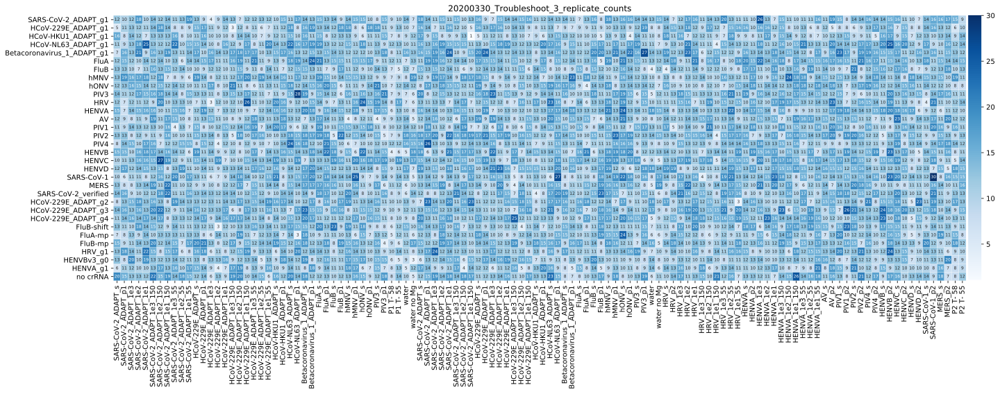

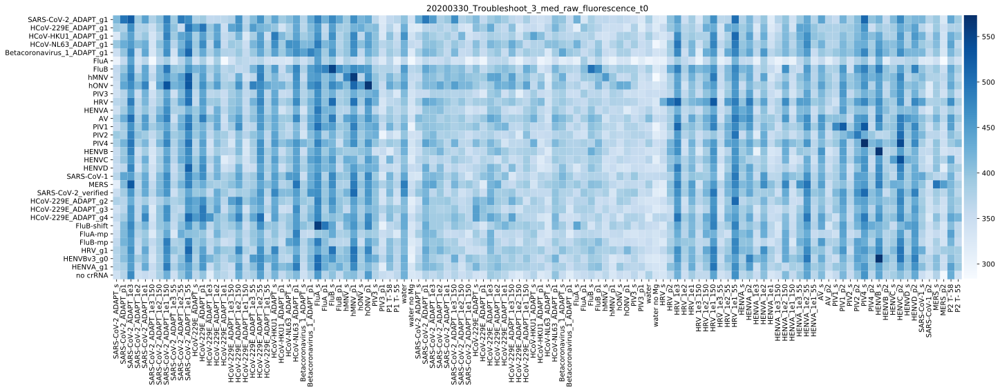

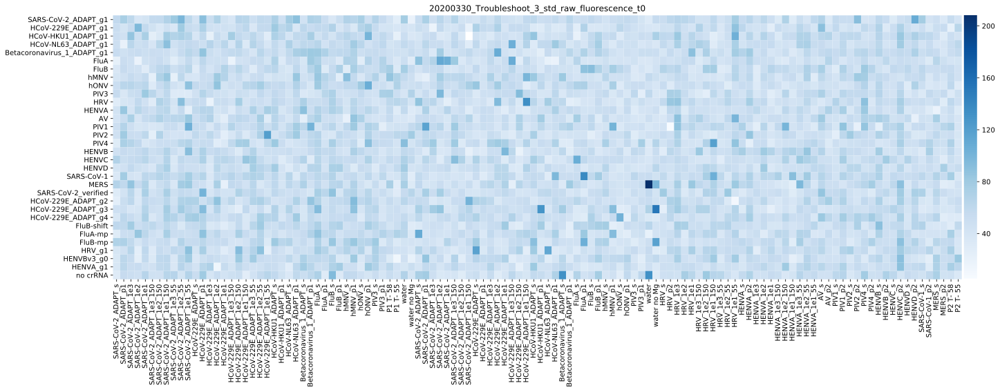

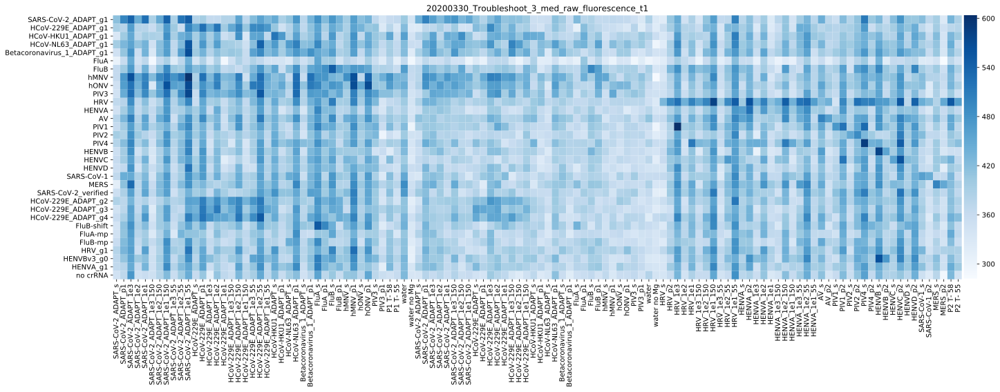

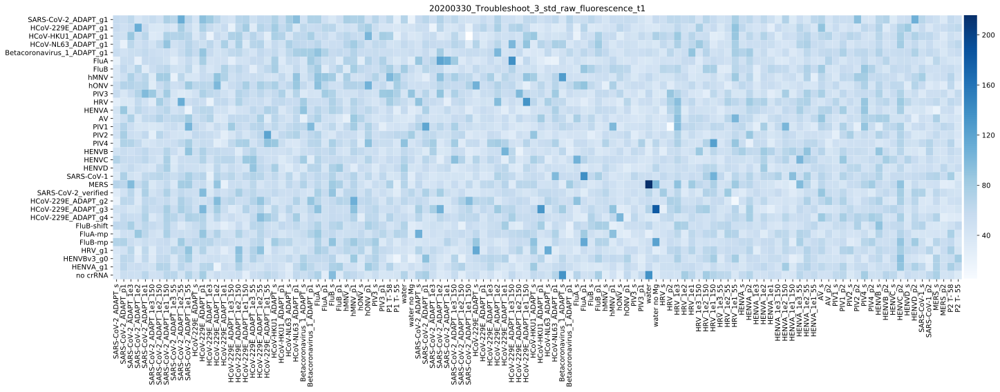

...

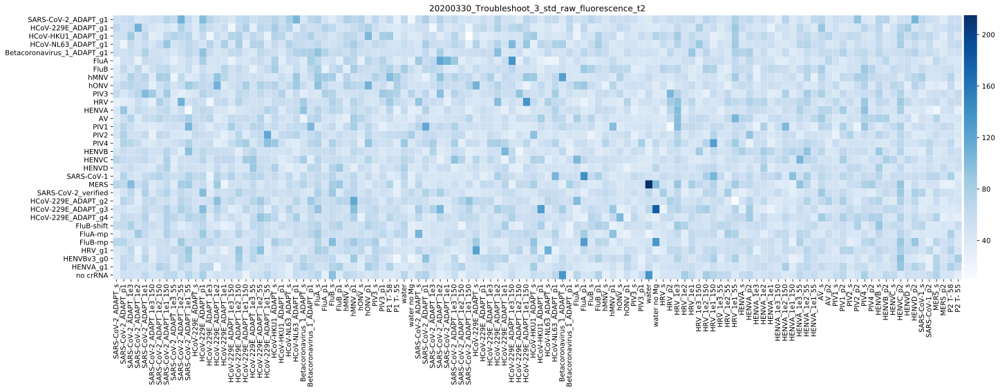

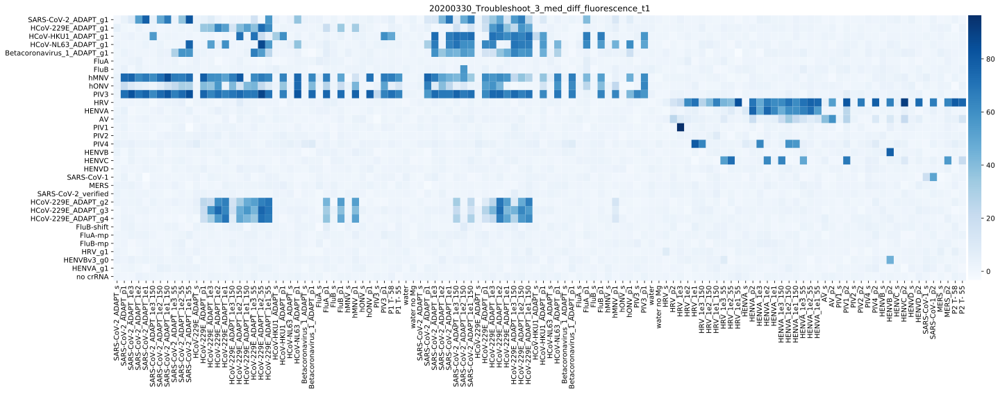

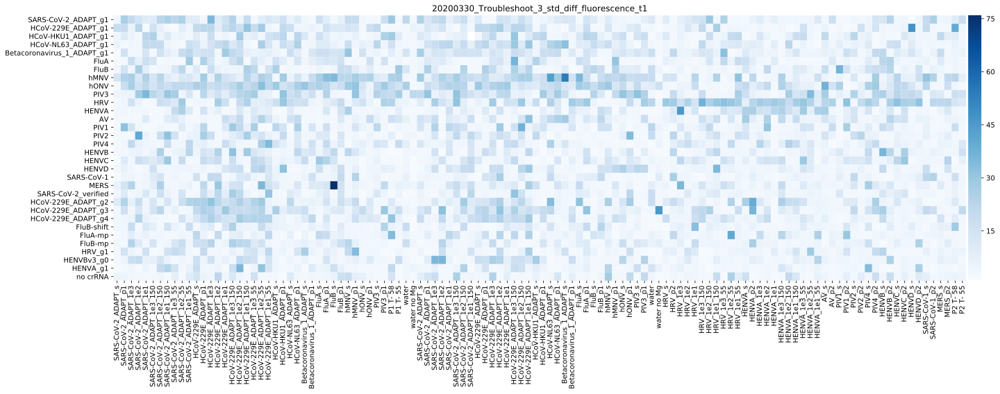

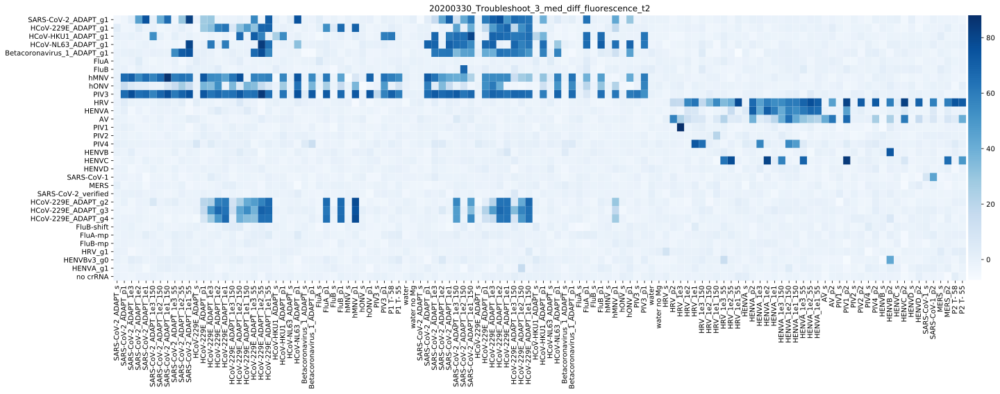

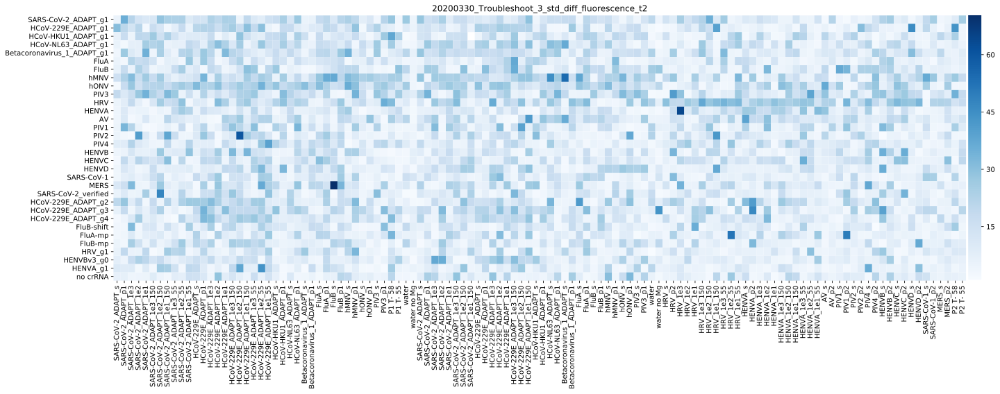

In [66]:
for i in range(len(dfs)):
    plot_heatmap(dfs[i],exp_string,titles[i],annot[i])

# Example functions from Cheri

In [ ]:
##### Plot ratio heatmap:
%config InlineBackend.figure_format = 'svg'

tgt_num = len(median_t2.index)
gd_num = len(median_t2.columns)
fig, axes = plt.subplots(1,1, figsize=(gd_num*.22,tgt_num*.22))
plt.xlabel('Targets', size = 10)
plt.ylabel('Detection Mixes', size = 10)
plt.title('Raw fluorescence', size = 12)
# For renaming axes:
# x_vals = ['H'+str(n) for n in range(1,17)]
# x_vals.append('Neg Ctl')
# x_vals.append('Neg Ctl')
# y_vals = list(reversed(['crRNA'+str(n) for n in range(1,17)]))
# y_vals.insert(0,'No crRNA')
# cmap for p-values = nipy_spectral
# cmap for medians = viridis
# when annotating, add "linewidths = 0.2"
sns.heatmap(median_diff_t2, annot=False, fmt = "0.0f",\
            linewidths = 0, square = False, \
            cmap = 'viridis',cbar = True, \
            xticklabels=True,cbar_kws={'pad':0.002})
# axes.set_xticklabels(x_vals,size=10,rotation=90)
# axes.set_yticklabels(y_vals,size=10)
plt.yticks(rotation=0) 
# plt.savefig('200220_output_filtered_t3_norm2.png', dpi=200, bbox_inches='tight')

In [ ]:
# Plotting heatmaps for replicate #'s
%config InlineBackend.figure_format = 'svg'
# plt.figure(figsize=(8,10))
# plt.figure(figsize=(75,6))
tgt_num = len(num_fl.index)
gd_num = len(num_fl.columns)
fig, axes = plt.subplots(1,1, figsize=(gd_num*.22,tgt_num*.22))
plt.xlabel('Targets', size = 15)
plt.ylabel('Detection Mixes', size = 15)
plt.title('Number of replicates', size = 15)
# stat_fl_1_bk = stat_fl_1[['Target'+str(n) for n in range(1,25)]].sub(stat_fl_1['Target24'], axis=0)
# stat_fl_0_bk = stat_fl_0[['Target'+str(n) for n in range(1,25)]].sub(stat_fl_0['Target24'], axis=0)
# stat_fl_0_bk = stat_fl_0_bk.clip_lower(0)
# stat_fl_1_bk = stat_fl_1_bk.clip_lower(0)
# stat_fl = stat_fl_1/stat_fl_0
sns.heatmap(num_fl, annot=False, fmt = "0.0f",\
            linewidths = 0, square = False, cmap = 'viridis', cbar=True)
plt.yticks(rotation=0) 
# plt.savefig('200220_all_output_filtered_replicates_from_t1_final.png',\
#             dpi=200, bbox_inches='tight')